In [1]:
import obspy
import glob
from obspy import UTCDateTime as UTC
import datetime
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
from math import sin, cos, sqrt, atan2, radians
from scipy import signal
from cartopy.io import shapereader
from PIL import Image
from scipy.interpolate import griddata
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.io import shapereader
import os
from scipy.interpolate import griddata
import cartopy.io.img_tiles as tile
import math
import pyproj
from matplotlib.patches import Patch,Circle
geodesic = pyproj.Geod(ellps='WGS84')
import mpl_toolkits
from matplotlib.offsetbox import AnchoredText
import csv
import pandas as pd
import h5py
import matplotlib.patches as patches
from obspy.geodetics import kilometers2degrees
from obspy.taup import TauPyModel

In [2]:
def normalize(data,ref):
    return data/np.max(np.abs(ref))


def obspy_filter(data,lowcut,highcut,fs,order=4):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    z, p, k = signal.iirfilter(order, [low, high], btype='band',
                        ftype='butter', output='zpk')
    sos = signal.zpk2sos(z, p, k)
    new_data=signal.sosfilt(sos, data)
    return new_data

def locate_average(data,length,mode='maximum'):
    
    ave=np.convolve(data, np.ones(length)/length, mode='valid')
        
    if mode =='maximum':
        return np.max(ave)
    elif mode =='minimum':
        return np.min(ave)
    else: 
        raise 'error'

def cal_snr(data,st,lt,fs):
    signal=locate_average(data,st*fs,'maximum')
    noise=locate_average(data,lt*fs,'minimum')
    snr=10*np.log10(signal/noise)
    return snr


class trace():
    
    def __init__ (self,data,samp_rate):
        self.data_len = len(data)
        self.spectrum = np.fft.fft(data)[:int(self.data_len/2)]
        self.freq = np.fft.fftfreq(self.data_len,1/samp_rate)[:int(self.data_len/2)]
        
        
    def multi_filter(self, filter_freqs, bandwidth):

        class Gauss():
            def __init__(self, f0, a=1.0):
                self._omega0 = 2.*math.pi*f0
                self._a = a
            def evaluate(self, freqs):
                omega = 2.*math.pi*freqs
                return np.exp(-((omega-self._omega0)
                                 / (self._a*self._omega0))**2)

        freqs = self.freq
        coefs = self.spectrum
        n = self.data_len
        nfilt = len(filter_freqs)
        signal_tf = np.zeros((nfilt, n))
        centroid_freqs = np.zeros(nfilt)
        for ifilt, f0 in enumerate(filter_freqs):
            taper = Gauss(f0, a=bandwidth)
            weights = taper.evaluate(freqs)
            nhalf = freqs.size
            analytic_spec = np.zeros(n, dtype=complex)
            analytic_spec[:nhalf] = coefs*weights
            if n % 2 == 0:
                analytic_spec[1:nhalf] *= 2.
            else:
                analytic_spec[nhalf+1:] = np.flip(analytic_spec[:nhalf])
            analytic = np.fft.ifft(analytic_spec)
            signal_tf[ifilt, :] = analytic.real
            enorm = np.abs(analytic_spec[:nhalf])**2
            enorm /= np.sum(enorm)
            centroid_freqs[ifilt] = np.sum(freqs*enorm)

        return centroid_freqs, signal_tf
    
    def freq_snr (self, filter_freqs, bandwidth):
        cf,signal_tf=self.multi_filter(filter_freqs,bandwidth)
        snr_df=np.zeros(len(signal_tf))
        for i in range(len(signal_tf)):
            snr_df[i]=cal_snr(np.abs(signal_tf[i,:]),3,10,100)
        
        return cf, snr_df
    
    
### prepare 100Hz data given a start time

paths = glob.glob('/nfs/turbo/lsa-zspica/data/Kamaishi/DAS/RAW/DATA_exp2/2019/11/20/*')
for i in range(21,31):
    paths += glob.glob('/nfs/turbo/lsa-zspica/data/Kamaishi/DAS/RAW/DATA_exp2/2019/11/'+str(i)+'/*')
paths += glob.glob('/nfs/turbo/lsa-zspica/data/Kamaishi/DAS/RAW/DATA_exp2/2019/12/01/*')
paths.sort()


def locate_h5(starttime):
        
    endtime=starttime+60
    
    mastertime=UTC('2019-11-20T00:00:24.62995')

    for i in range(len(paths)):
        
        if endtime <= mastertime+300*i:
                        
            if mastertime+300*i-endtime <= 60:
                files=[paths[i-1],paths[i]]
                file_starttime=mastertime+300*(i-1)
                
            else:
                files=[paths[i-2],paths[i-1]]
                file_starttime=mastertime+300*(i-2)
                
            break
    print(files)
            
    startpoint=int((starttime-file_starttime)*500) 
    endpoint=startpoint+30000
    
    if endpoint<150000:
        f=h5py.File(files[0],'r')['DAS']
        df=np.array(f[startpoint:endpoint,:])
    elif startpoint>150000:
        f=h5py.File(files[1],'r')['DAS']
        df=np.array(f[startpoint-150000:endpoint-150000,:])
    else:
        f1=h5py.File(files[0],'r')['DAS']
        df1=np.array(f1[startpoint:,:])
        f2=h5py.File(files[1],'r')['DAS']
        df2=np.array(f2[:startpoint-120000,:])
        df=np.concatenate((df1,df2))
        
    return df.T

In [3]:
### coordinates

stations = pd.read_csv('/nfs/turbo/lsa-zspica/work/yaolinm/for_jiuxun/Channel_position_LV_v2.csv',header=None,delimiter=',')
lats=stations[1]
lons=stations[2]

eq1_lat=39.819
eq1_lon=142.288
eq1_dep=26.4
eq2_lat=38.913
eq2_lon=142.365
eq2_dep=35.9
eq3_lat=38.786
eq3_lon=142.345
eq3_dep=23.7

In [4]:
dframe=pd.read_csv('/nfs/turbo/lsa-zspica/work/yaolinm/Japan_detection/final_catalog_14s/passed_events_newnew.csv')
eindex=dframe['Index']
magnitude=dframe['Magnitude']
latitude=dframe['Latitude']
longitude=dframe['Longitude']
distance=dframe['Epi-distance']
wsss=dframe['WSS']
ssss=dframe['SSS']
depth=dframe['Depth']
date=dframe['Date']
time=dframe['Time']

In [5]:
todo_index=[]

for i in range(len(eindex)):
    
    if distance[i] <=100 and magnitude[i]>=1 and wsss[i]==0 and ssss[i]==0:
        
        todo_index.append(i)

# undetected, trim OBS and define time

315 1.0 94.05254491286632 2019-11-21T03:50:31.630000Z 41
25.573157838627203


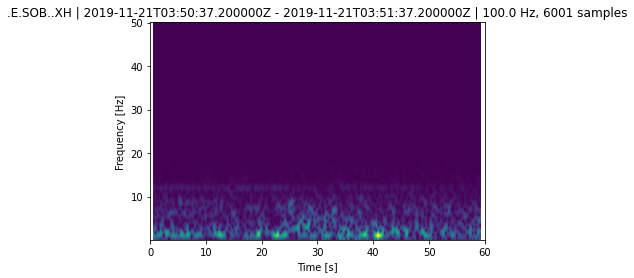

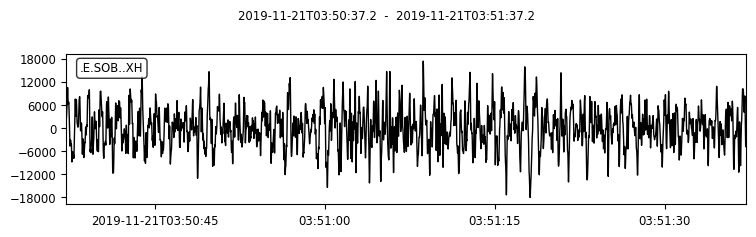

666 1.0 33.049917237366515 2019-11-21T22:05:01.840000Z 104
12.610216991477701


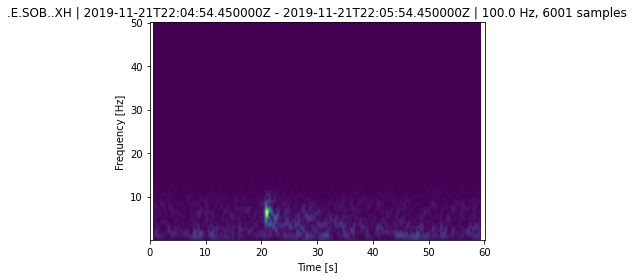

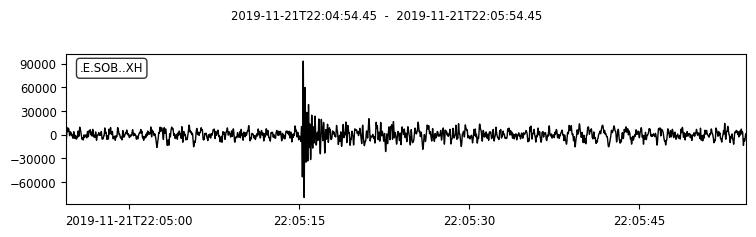

808 1.0 64.01521194851188 2019-11-22T04:08:37.650000Z 129
18.717888372912874


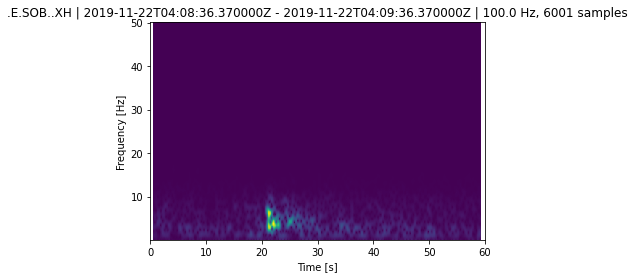

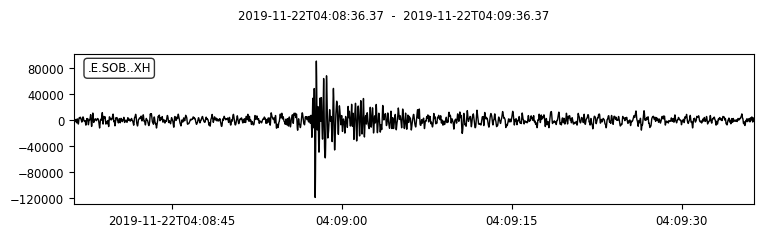

827 1.0 89.25071087093468 2019-11-22T04:55:02.190000Z 131
24.856098240163114


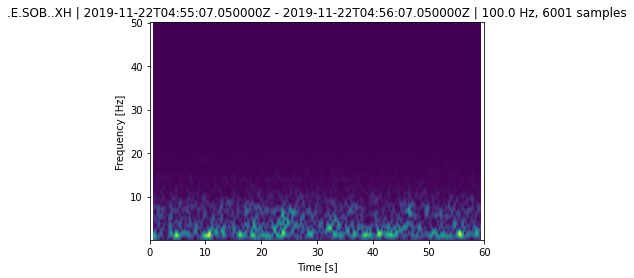

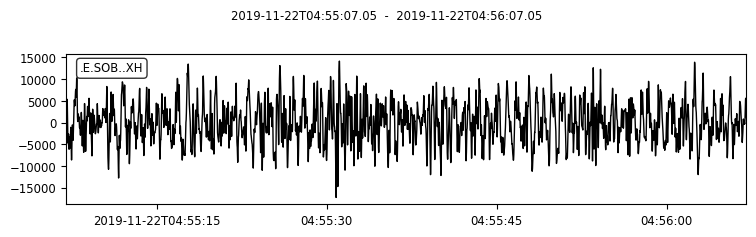

1000 1.1 26.48582783568524 2019-11-22T15:33:48.230000Z 158
12.036906829310261


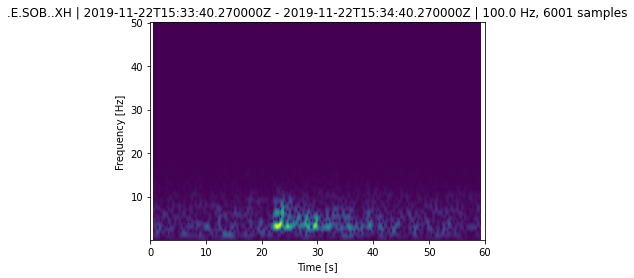

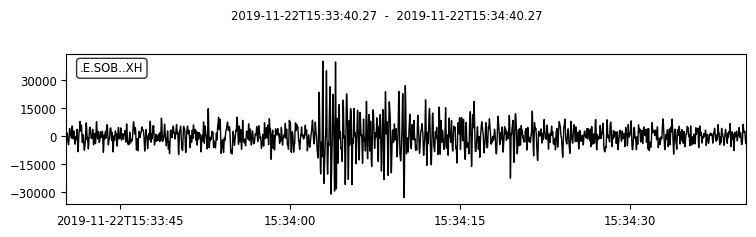

1483 1.3 91.37723561135644 2019-11-23T16:22:54.800000Z 244
25.452178898292907


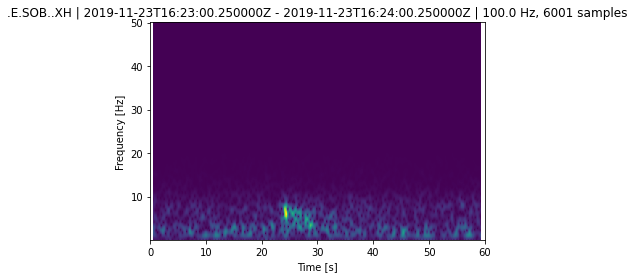

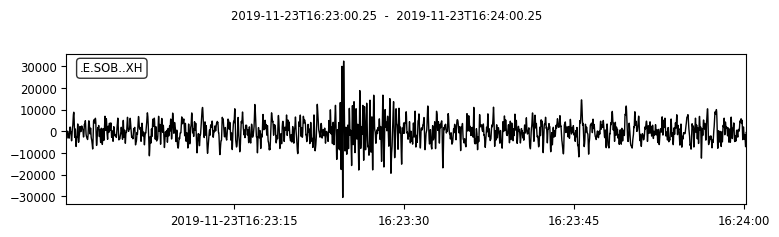

1568 1.0 90.73746294961823 2019-11-23T21:13:42.190000Z 255
25.18282720674245


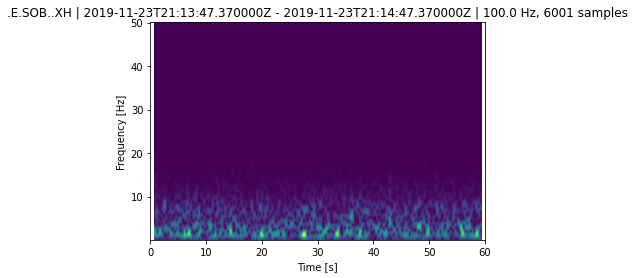

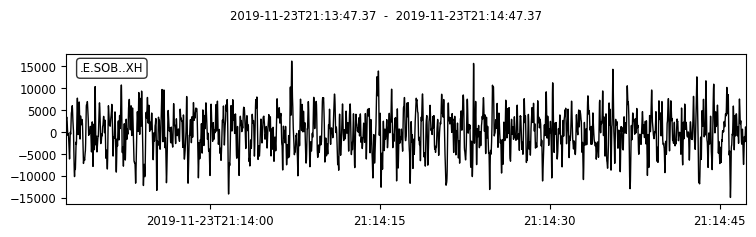

1678 1.4 55.844963358305776 2019-11-24T02:07:30.560000Z 274
16.972069127958886


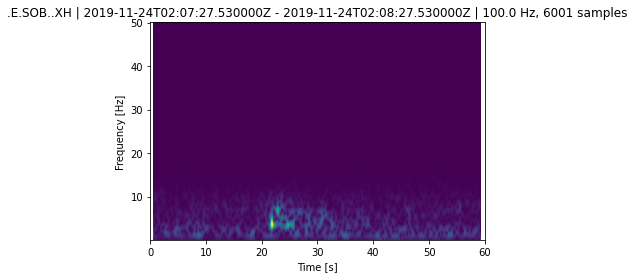

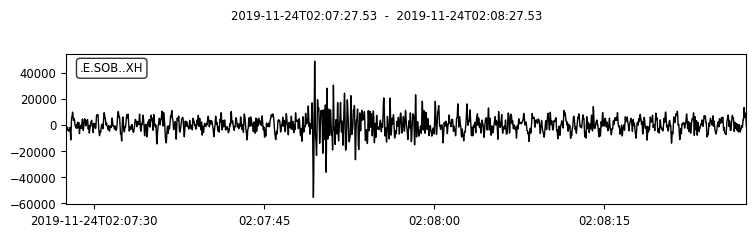

2054 1.1 97.5908893881832 2019-11-24T21:10:18.970000Z 324
26.152326860484617


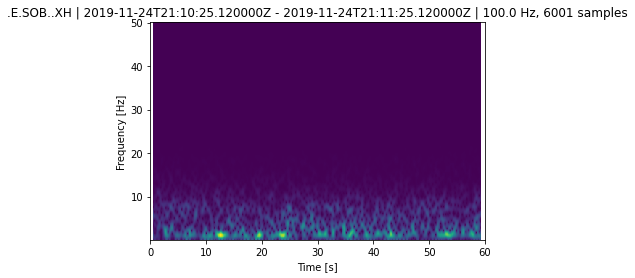

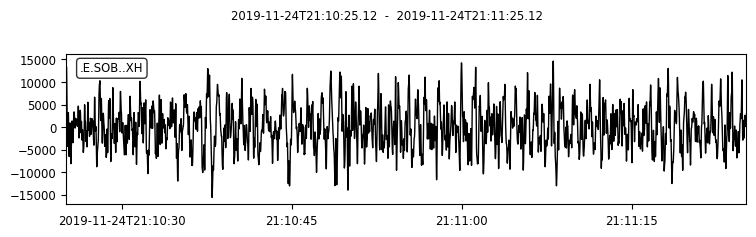

2281 1.0 61.583322757109606 2019-11-25T06:24:26.830000Z 353
18.708298595217567


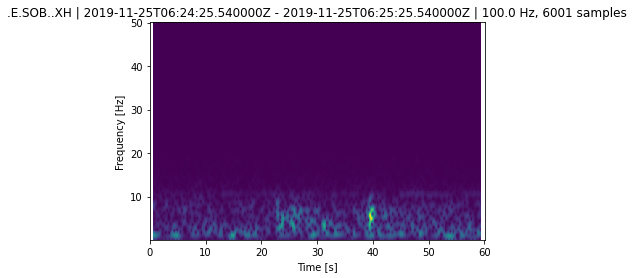

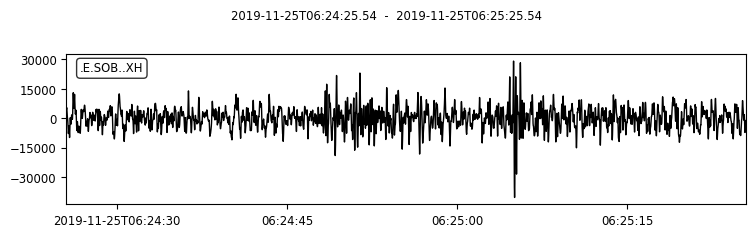

2312 1.3 95.32204828064287 2019-11-25T07:43:39.600000Z 356
25.652113748104195


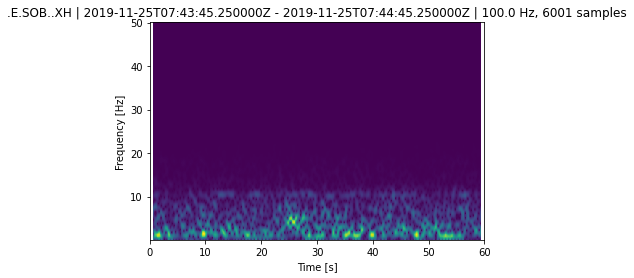

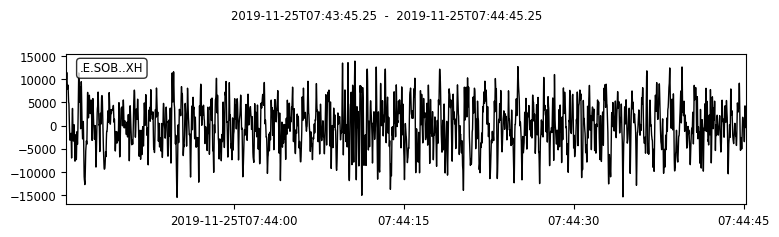

3118 1.1 86.5258545558068 2019-11-27T03:52:37.610000Z 486
23.850401418821832


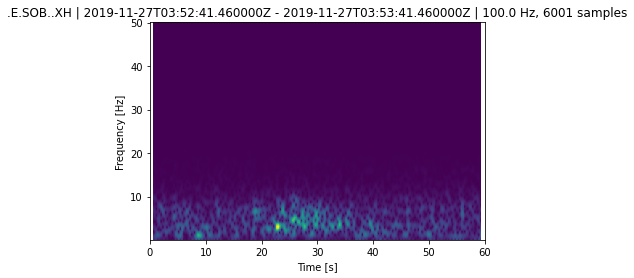

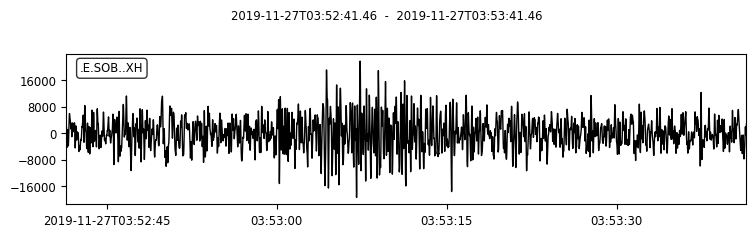

3477 1.2 82.94732712780494 2019-11-27T23:59:59.750000Z 547
23.012597535791425


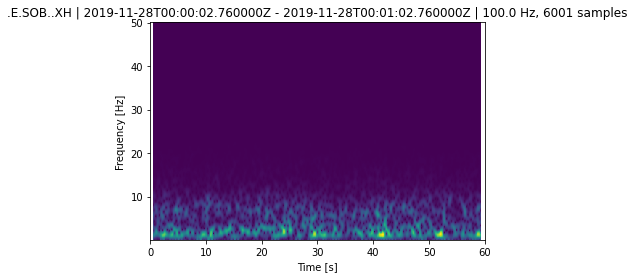

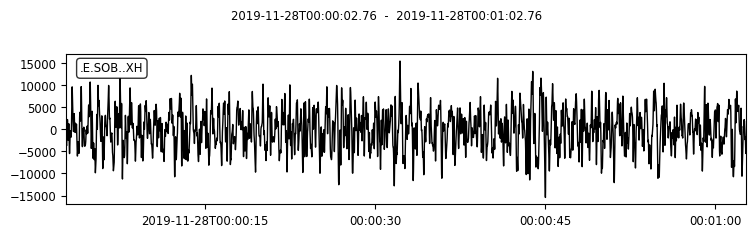

3525 1.0 57.3004582043616 2019-11-28T02:37:13.860000Z 554
19.185430787720026


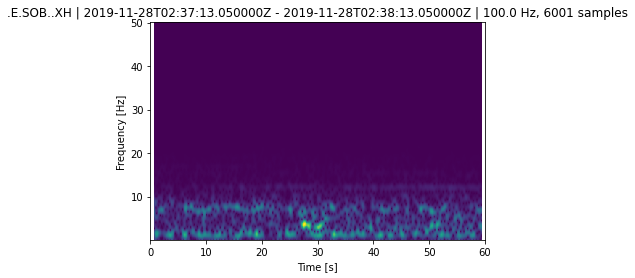

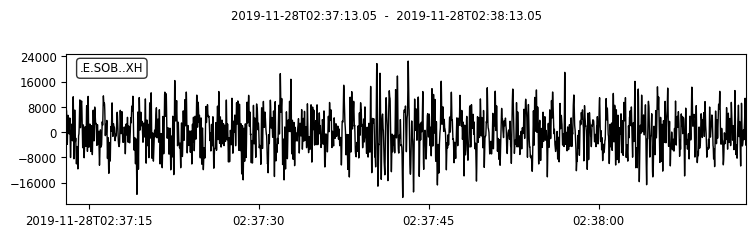

3777 1.0 88.33561590200908 2019-11-28T19:12:16.220000Z 607
24.12284747515562


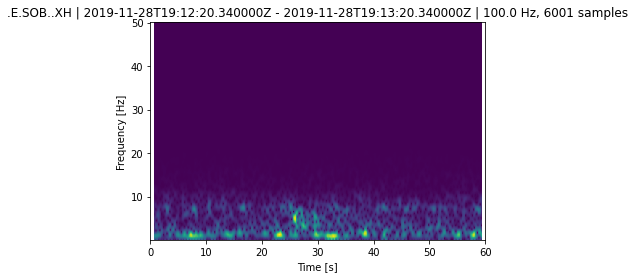

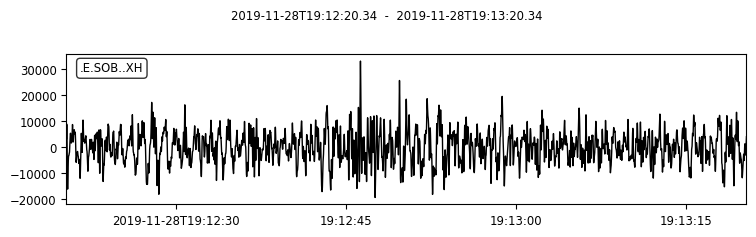

3836 1.0 49.72778674432351 2019-11-28T22:13:39.300000Z 622
15.836096843957117


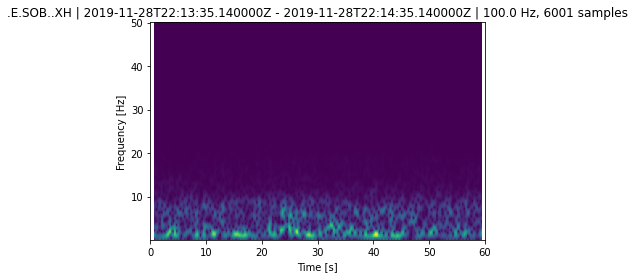

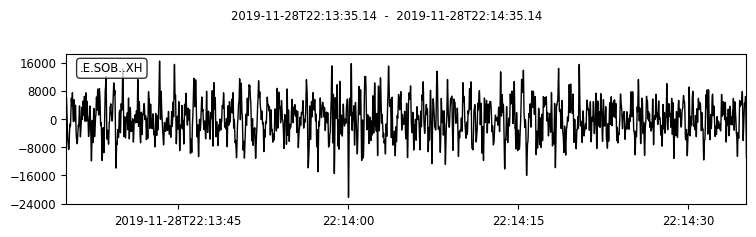

3926 1.2 94.9066618378332 2019-11-29T02:47:16.830000Z 641
25.655652115375926


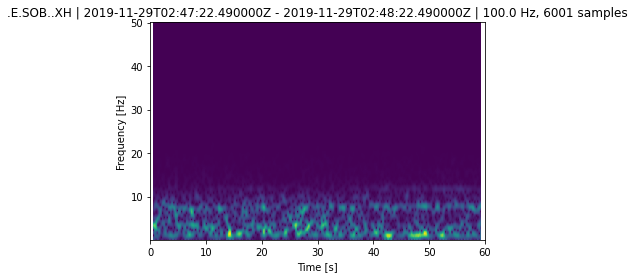

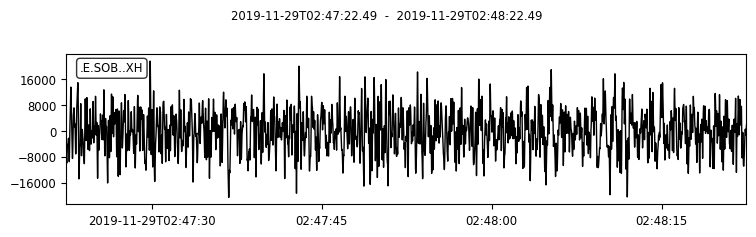

4755 1.1 79.76946097293404 2019-11-30T19:38:14.010000Z 764
22.207034115615297


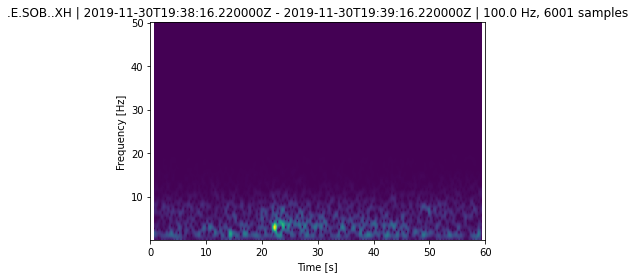

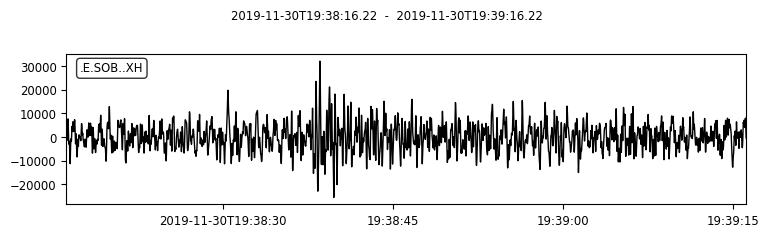

In [6]:
model=TauPyModel(model='prem')

for i in range(len(eindex)):
    if distance[i] <=100 and magnitude[i]>=1 and wsss[i]==0 and ssss[i]==0:
        print(eindex[i],magnitude[i],distance[i],UTC(date[i]+'T'+time[i]),i)
        
        arrivals = model.get_travel_times(source_depth_in_km=depth[i],
                                  distance_in_degree=kilometers2degrees(distance[i]),
                                  phase_list=['s','S'])
        print(arrivals[0].time)

        starttime=UTC(date[i]+'T'+time[i])+arrivals[0].time
        mseed='/nfs/turbo/lsa-zspica/data/Kamaishi/OBS/exp2/Acceleration_data_v2/2019'+str(starttime.month).zfill(2)+str(starttime.day).zfill(2)+'.mseed'
        obs1=obspy.read(mseed)
        obs1[0].filter('bandpass',freqmin=1,freqmax=8)
        obs1[0].trim(starttime=starttime-20,endtime=starttime+40)
        obs1[0].spectrogram()
        obs1[0].plot()

In [108]:
for i in range(len(eindex)):
    
    if eindex[i]==1674:
        print(eindex[i],magnitude[i],distance[i],UTC(date[i]+'T'+time[i]),i)
        
        arrivals = model.get_travel_times(source_depth_in_km=depth[i],
                                  distance_in_degree=kilometers2degrees(distance[i]),
                                  phase_list=['s','S'])
        print(arrivals[0].time)
        
        starttime=UTC(date[i]+'T'+time[i])+arrivals[0].time-20-9*3600
        data=locate_h5(starttime)
        data=signal.decimate(data,5,axis=-1)[300:9600,:]   
        
        np.save('/scratch/zspica_root/zspica0/yaolinm/Japan/undetected/waveform/'+str(eindex[i]).zfill(4),data)
        
        fqs=np.exp(np.linspace(np.log(1), np.log(12), 40))
        snrf=np.zeros((9300,40))
        for j in range(0,9300):
            tr=trace(data[j,:],100)
            cf,stf=tr.freq_snr(fqs,0.25)
            snrf[j,:]=stf
            
        np.save('/scratch/zspica_root/zspica0/yaolinm/Japan/undetected/snr/'+str(eindex[i]).zfill(4)+'.npy',snrf)

1674 1.0 63.0110572850883 2019-11-24T02:02:11.910000Z 273
18.486322790776896
['/nfs/turbo/lsa-zspica/data/Kamaishi/DAS/RAW/DATA_exp2/2019/11/23/0000005950_2019-11-23_16.55.24.66955.hdf5', '/nfs/turbo/lsa-zspica/data/Kamaishi/DAS/RAW/DATA_exp2/2019/11/23/0000005952_2019-11-23_17.00.24.66955.hdf5']


In [ ]:
for i in range(len(eindex)):
    
    if distance[i] <=100 and magnitude[i]>=1 and wsss[i]==0 and ssss[i]==0:
        print(eindex[i],magnitude[i],distance[i],UTC(date[i]+'T'+time[i]),i)
        
        arrivals = model.get_travel_times(source_depth_in_km=depth[i],
                                  distance_in_degree=kilometers2degrees(distance[i]),
                                  phase_list=['s','S'])
        print(arrivals[0].time)
        
        starttime=UTC(date[i]+'T'+time[i])+arrivals[0].time-20-9*3600
        data=locate_h5(starttime)
        data=signal.decimate(data,5,axis=-1)[300:9600,:]
        
        np.save('/scratch/zspica_root/zspica0/yaolinm/Japan/undetected/waveform/'+str(eindex[i]).zfill(4),data)
        
        snrf=np.zeros((9300,40))
        for j in range(0,9300):
            tr=trace(data[j,:],100)
            cf,stf=tr.freq_snr(fqs,0.25)
            snrf[j,:]=stf
            
        np.save('/scratch/zspica_root/zspica0/yaolinm/Japan/undetected/snr/'+str(eindex[i]).zfill(4)+'.npy',snrf)

315 1.0 94.05254491286632 2019-11-21T03:50:31.630000Z 41
25.573157838627203
666 1.0 33.049917237366515 2019-11-21T22:05:01.840000Z 104
12.610216991477701


/scratch/zspica_root/zspica0/yaolinm/Japan/undetected/snr/0315.npy


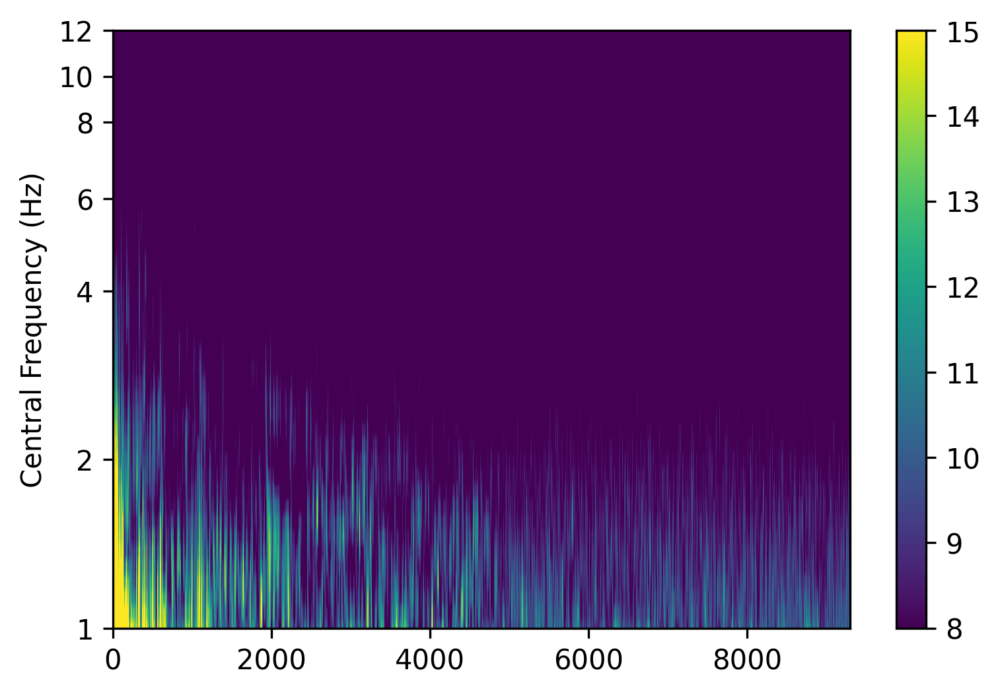

/scratch/zspica_root/zspica0/yaolinm/Japan/undetected/snr/0666.npy


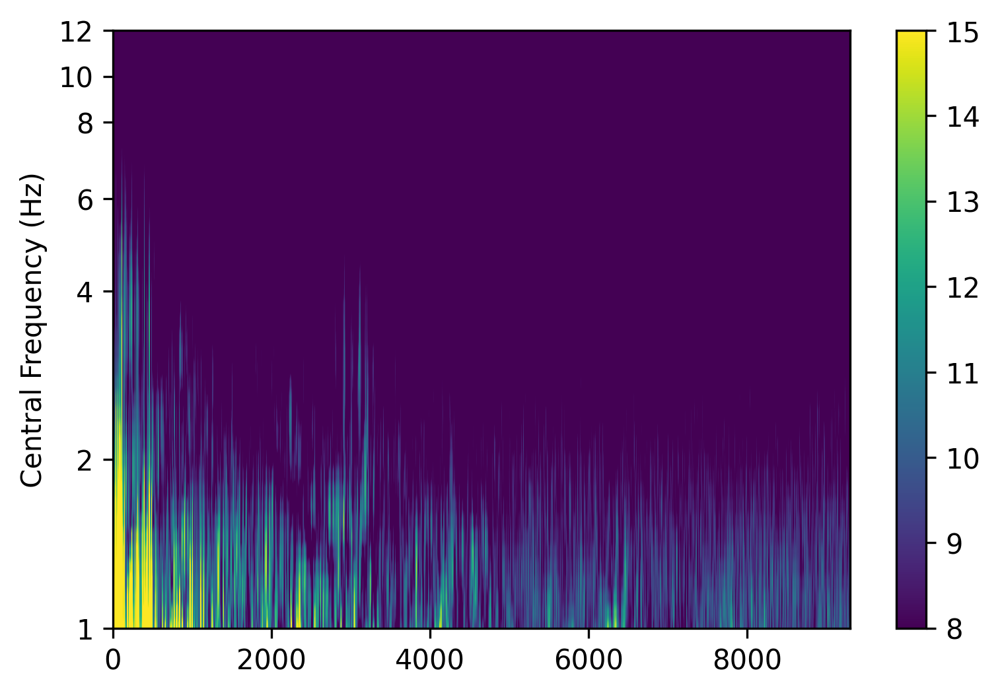

/scratch/zspica_root/zspica0/yaolinm/Japan/undetected/snr/0808.npy


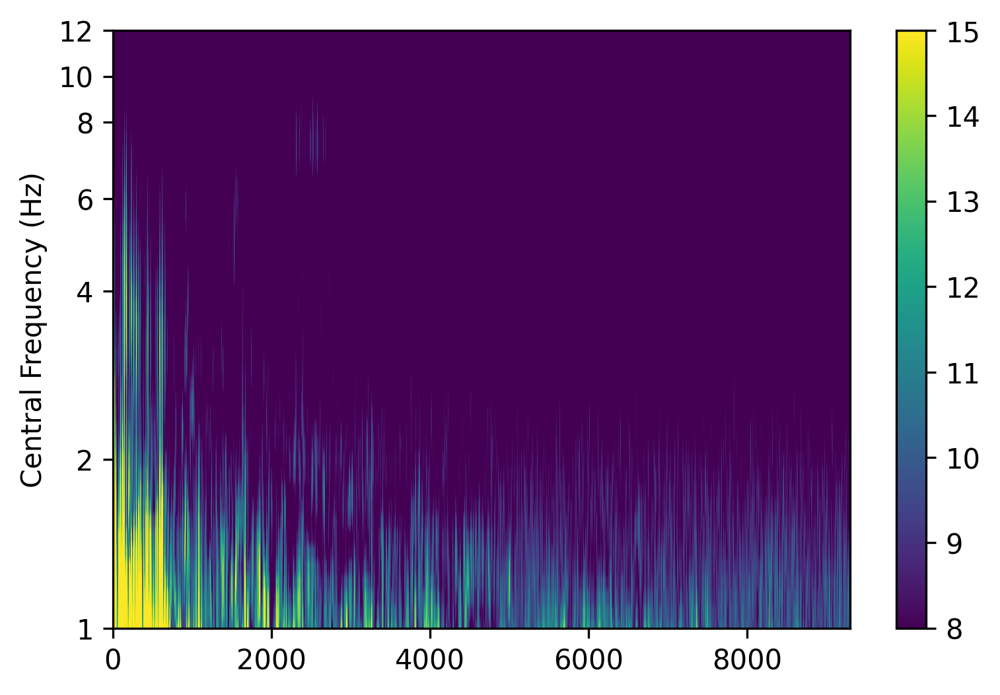

/scratch/zspica_root/zspica0/yaolinm/Japan/undetected/snr/0827.npy


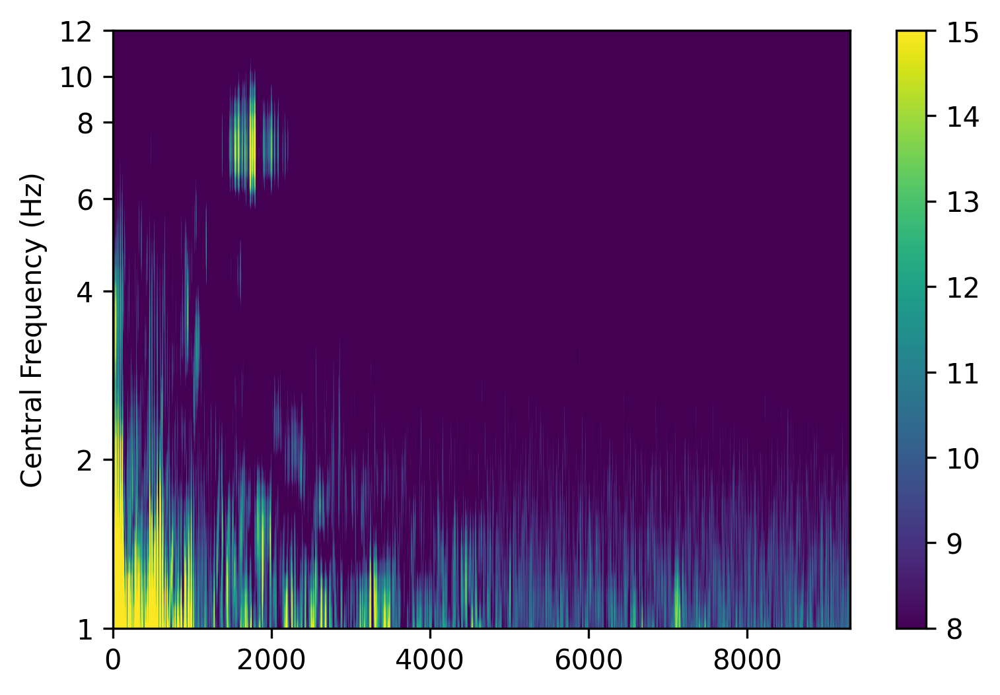

/scratch/zspica_root/zspica0/yaolinm/Japan/undetected/snr/1000.npy


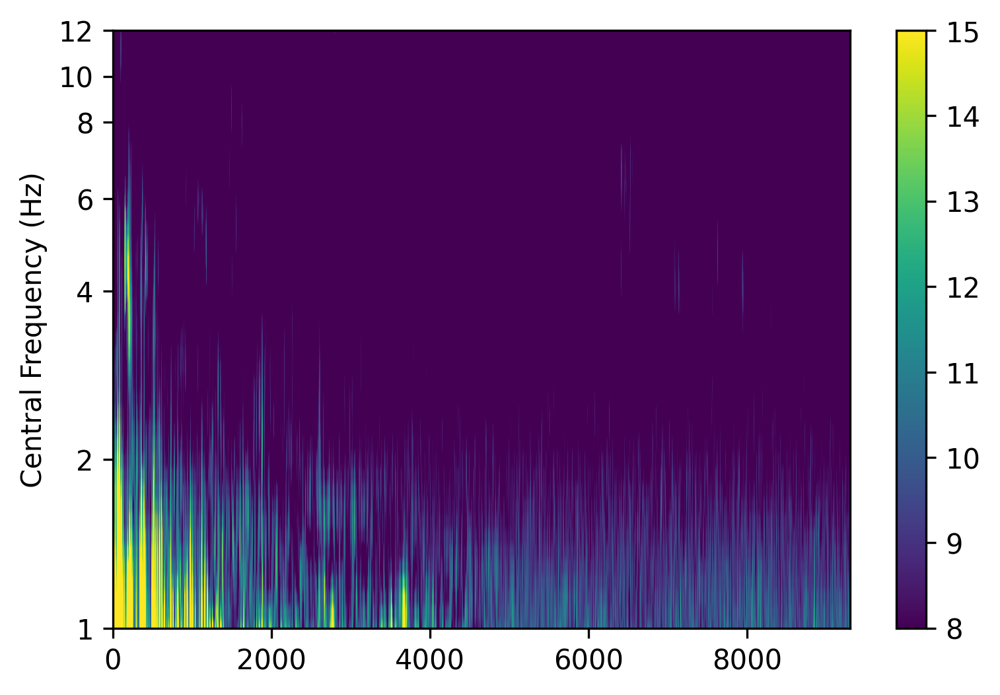

/scratch/zspica_root/zspica0/yaolinm/Japan/undetected/snr/1483.npy


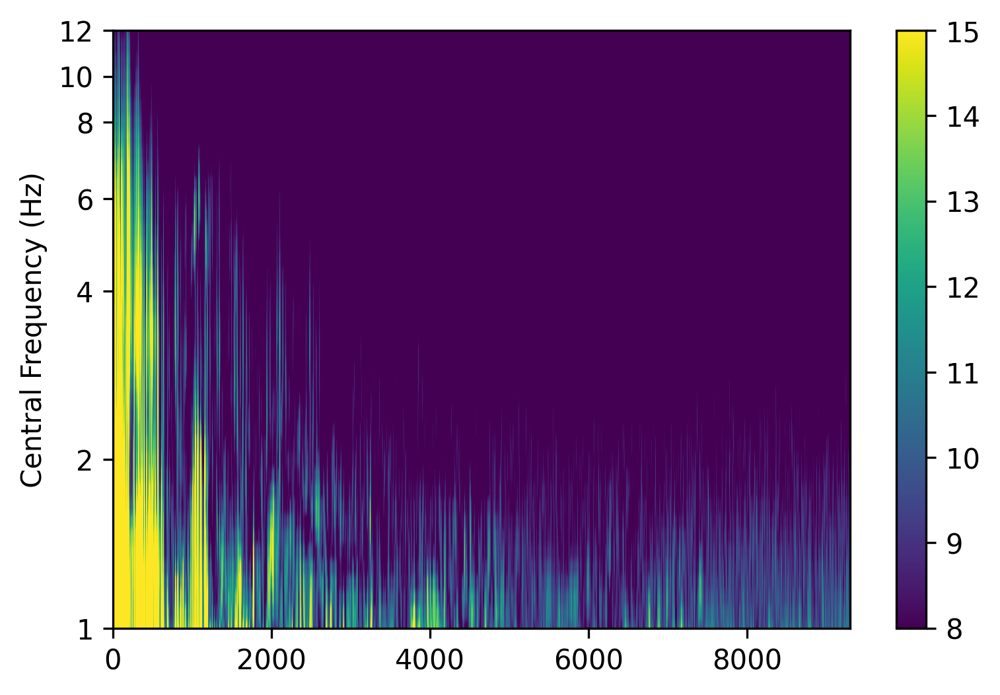

/scratch/zspica_root/zspica0/yaolinm/Japan/undetected/snr/1568.npy


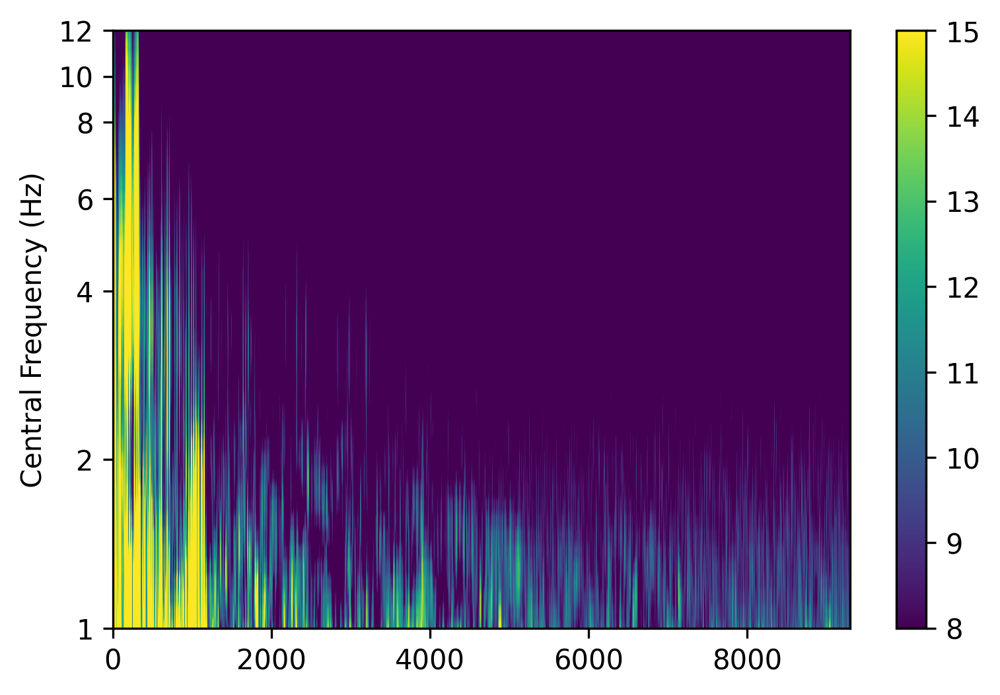

/scratch/zspica_root/zspica0/yaolinm/Japan/undetected/snr/1674.npy


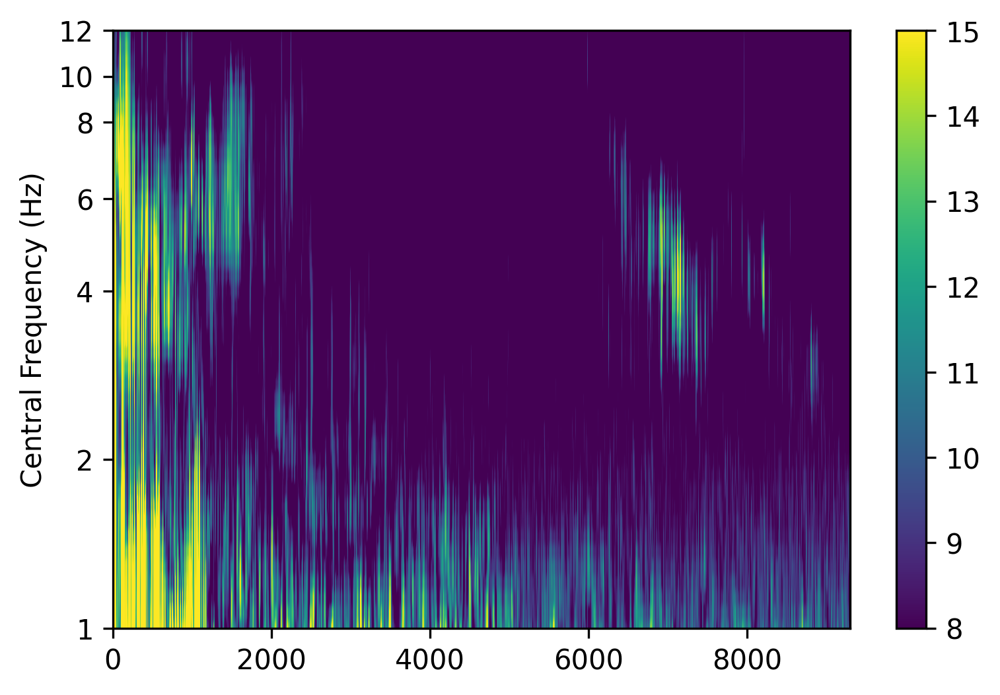

/scratch/zspica_root/zspica0/yaolinm/Japan/undetected/snr/1678.npy


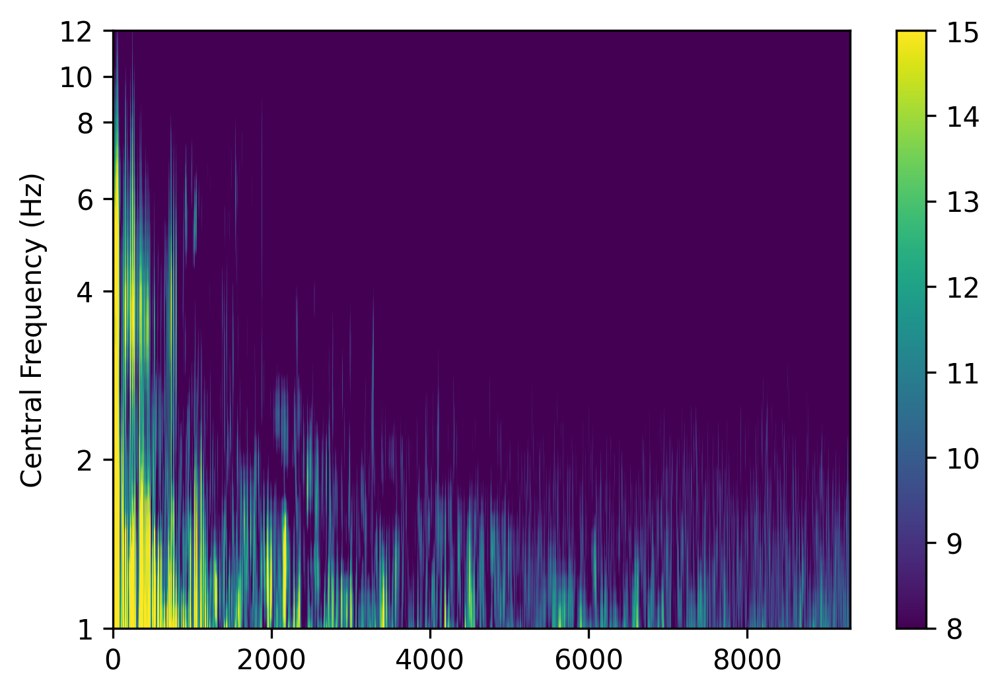

/scratch/zspica_root/zspica0/yaolinm/Japan/undetected/snr/2054.npy


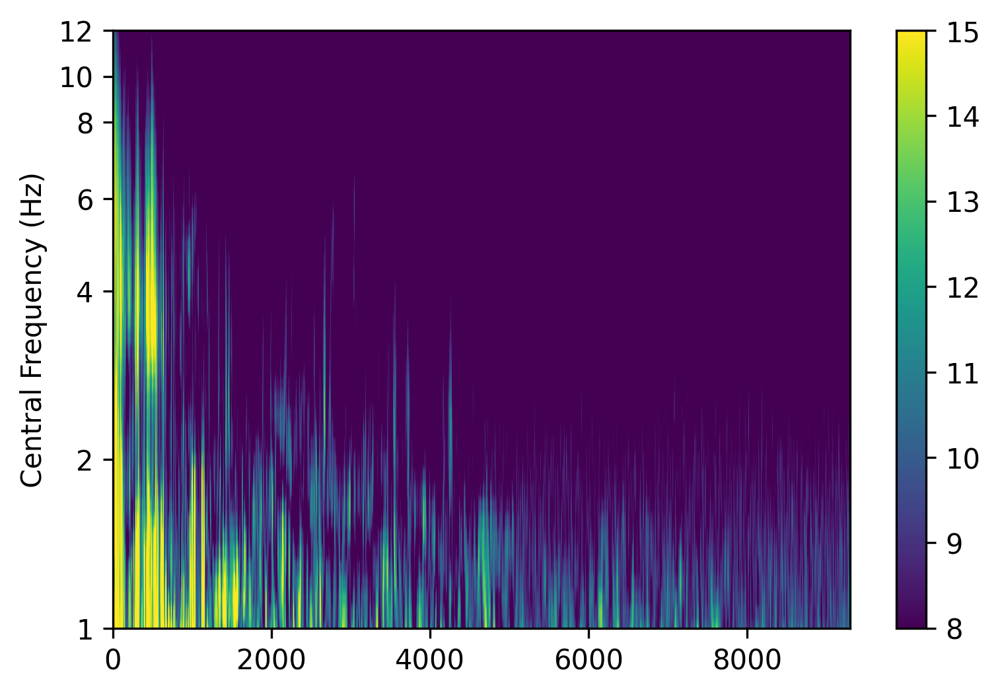

/scratch/zspica_root/zspica0/yaolinm/Japan/undetected/snr/2281.npy


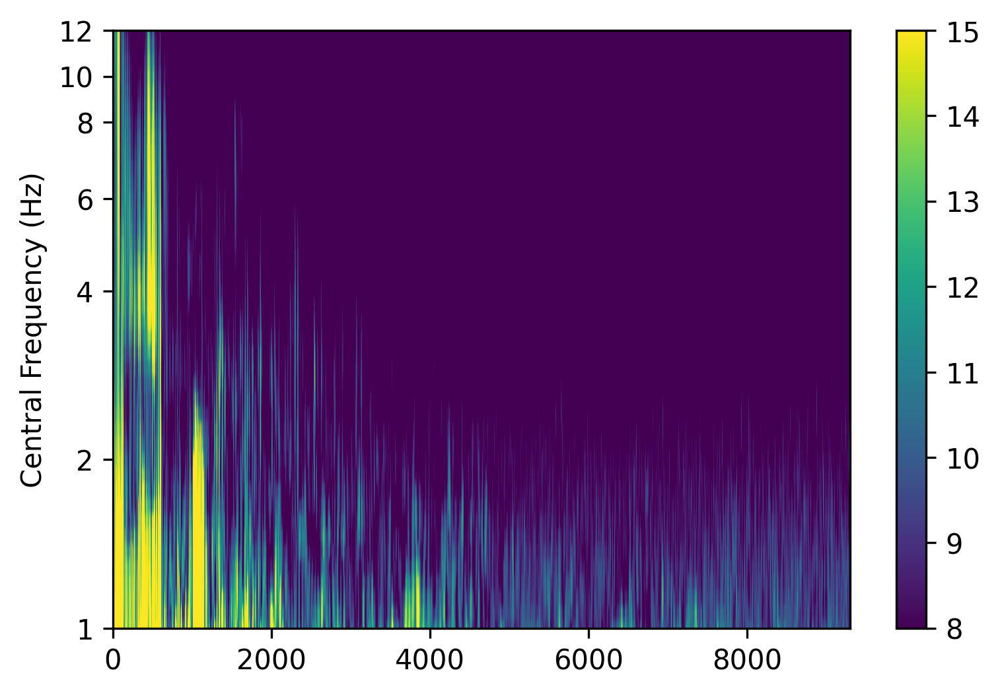

/scratch/zspica_root/zspica0/yaolinm/Japan/undetected/snr/2312.npy


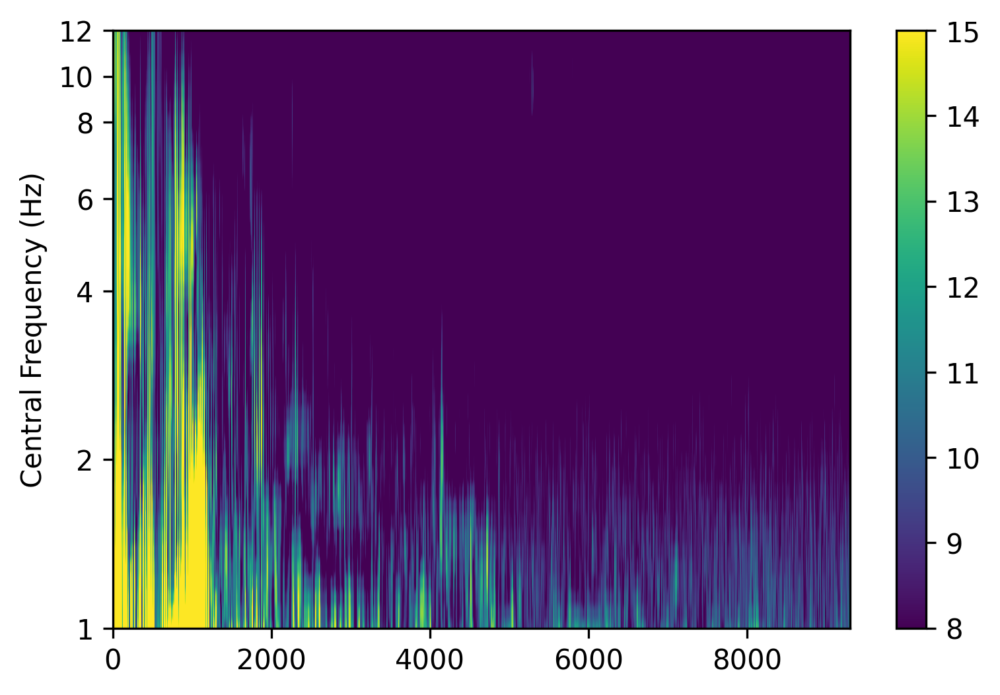

/scratch/zspica_root/zspica0/yaolinm/Japan/undetected/snr/3118.npy


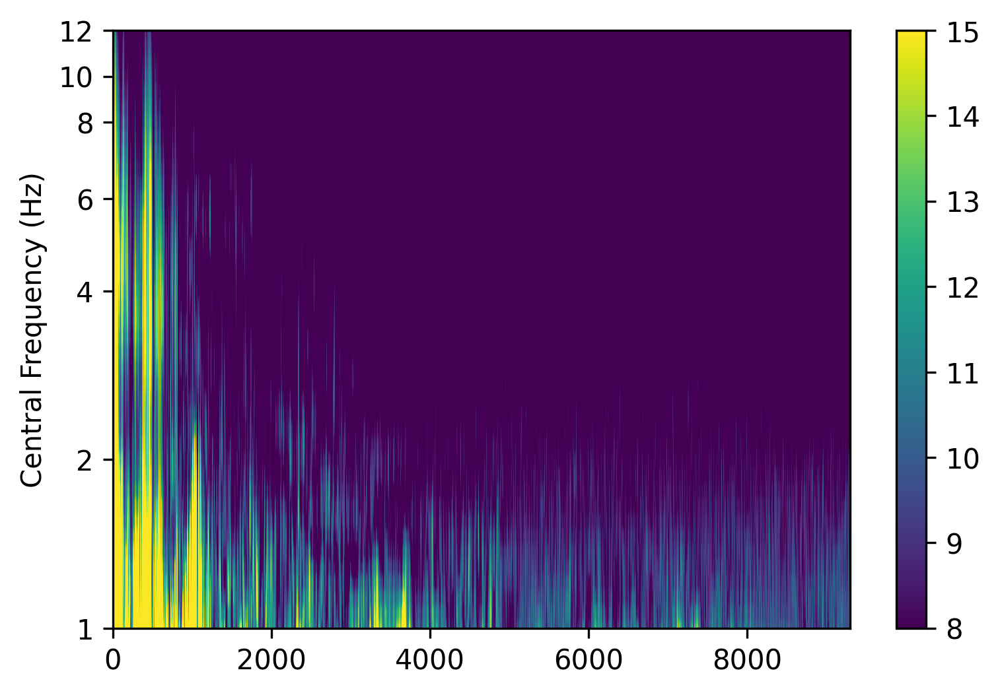

/scratch/zspica_root/zspica0/yaolinm/Japan/undetected/snr/3477.npy


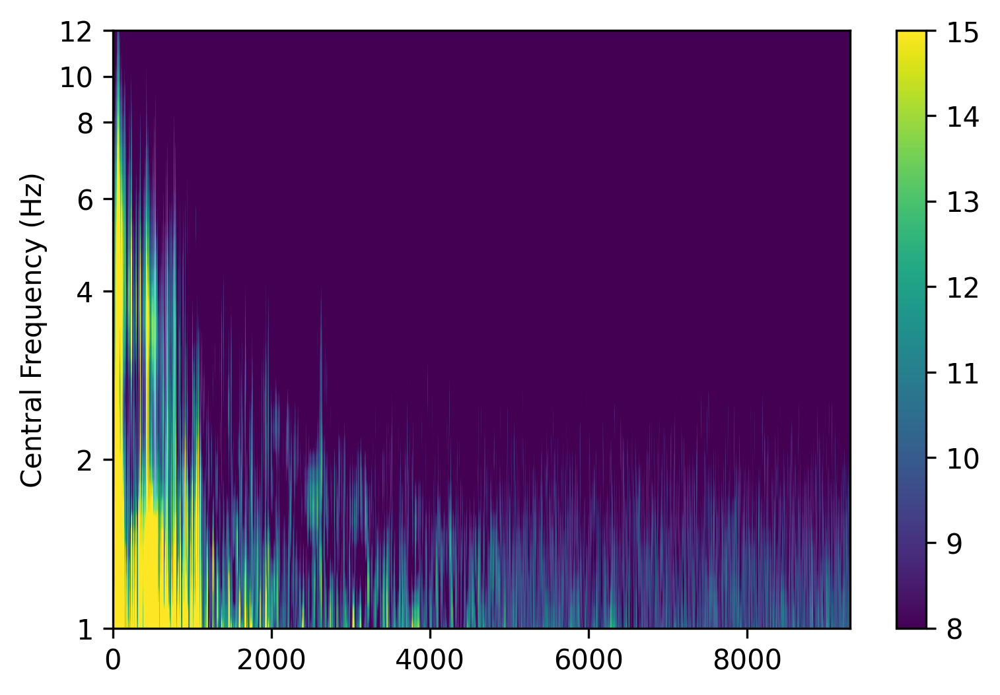

/scratch/zspica_root/zspica0/yaolinm/Japan/undetected/snr/3525.npy


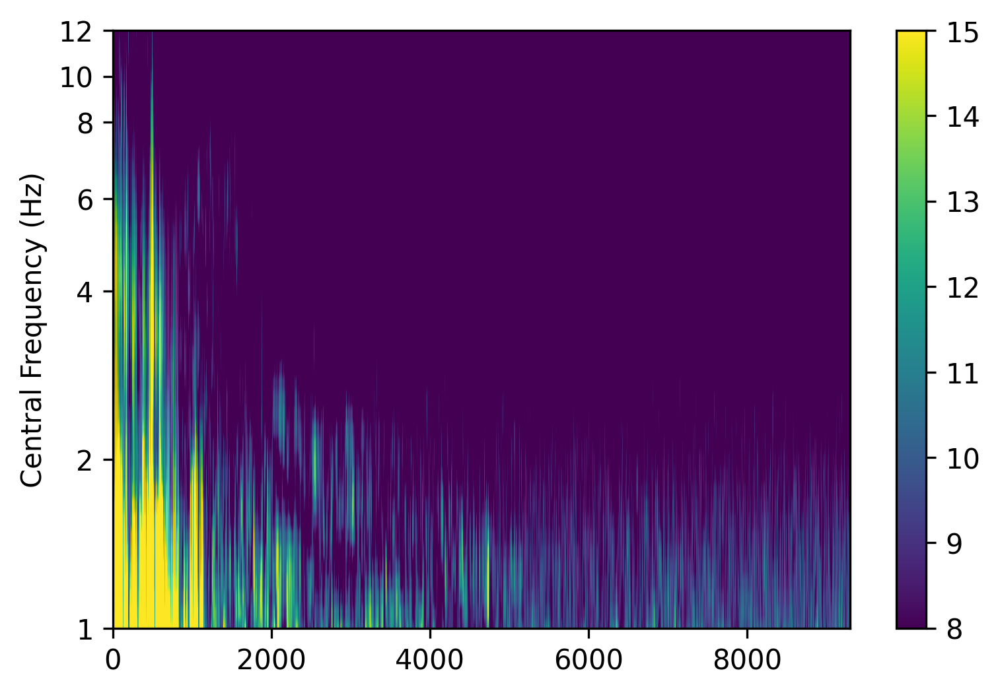

/scratch/zspica_root/zspica0/yaolinm/Japan/undetected/snr/3777.npy


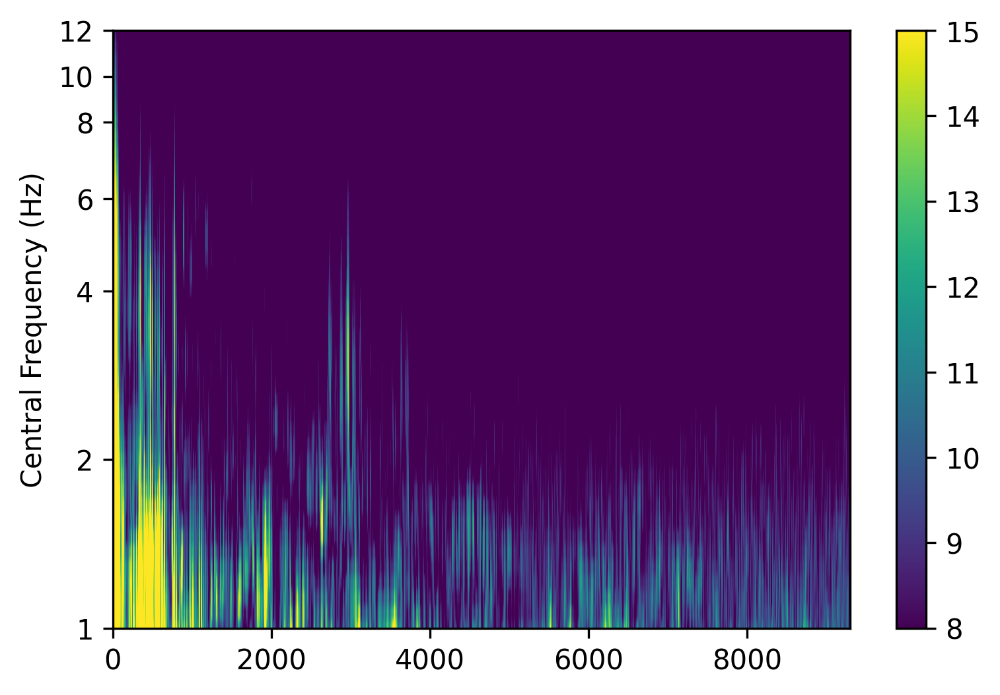

/scratch/zspica_root/zspica0/yaolinm/Japan/undetected/snr/3836.npy


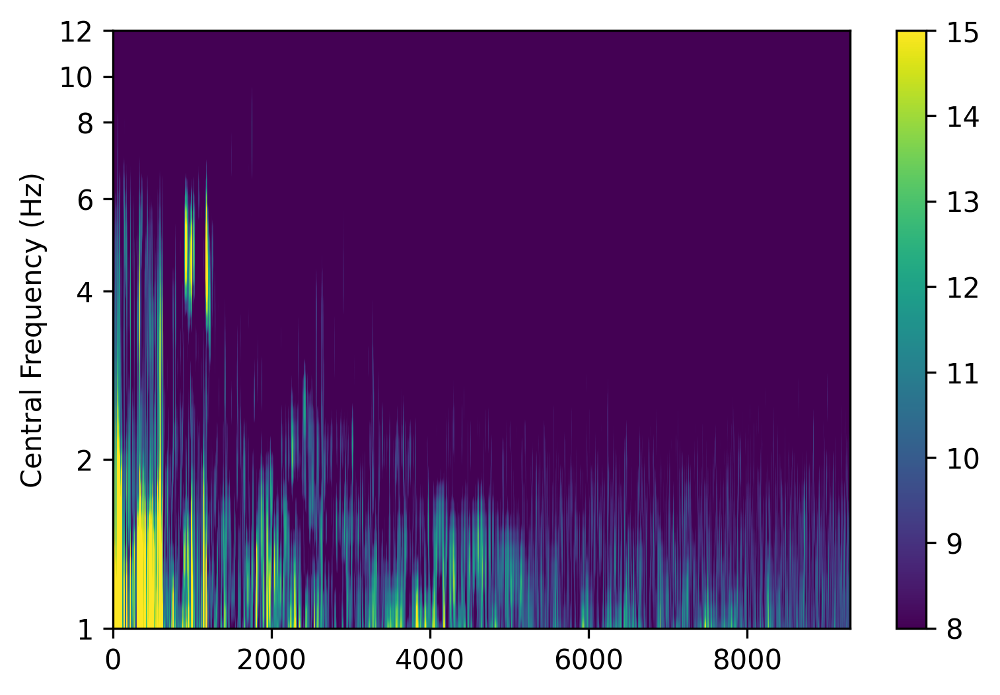

/scratch/zspica_root/zspica0/yaolinm/Japan/undetected/snr/3926.npy


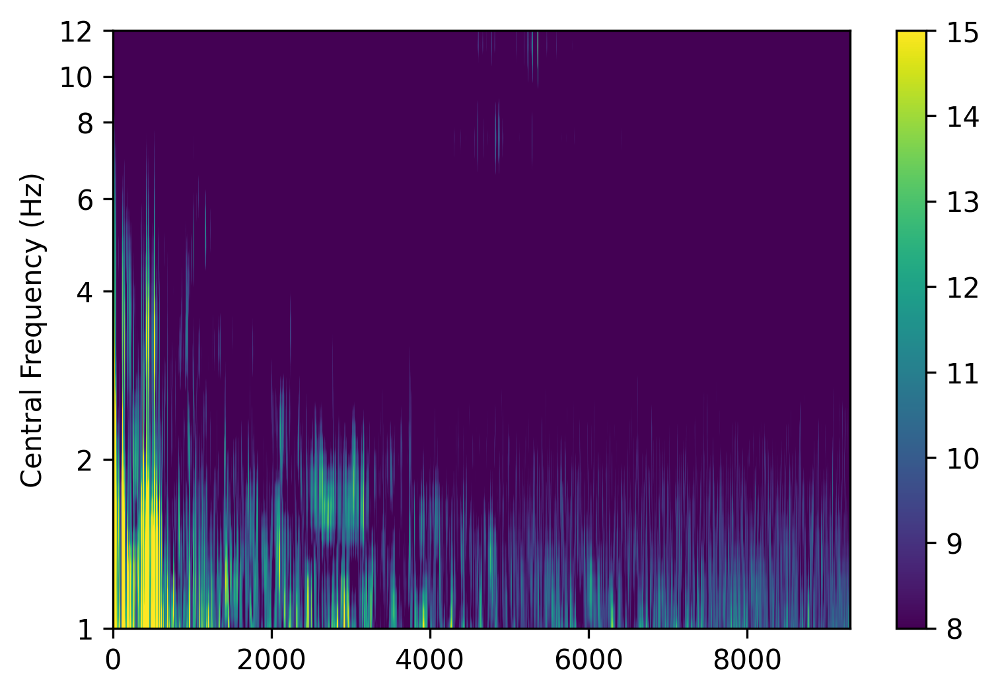

/scratch/zspica_root/zspica0/yaolinm/Japan/undetected/snr/4755.npy


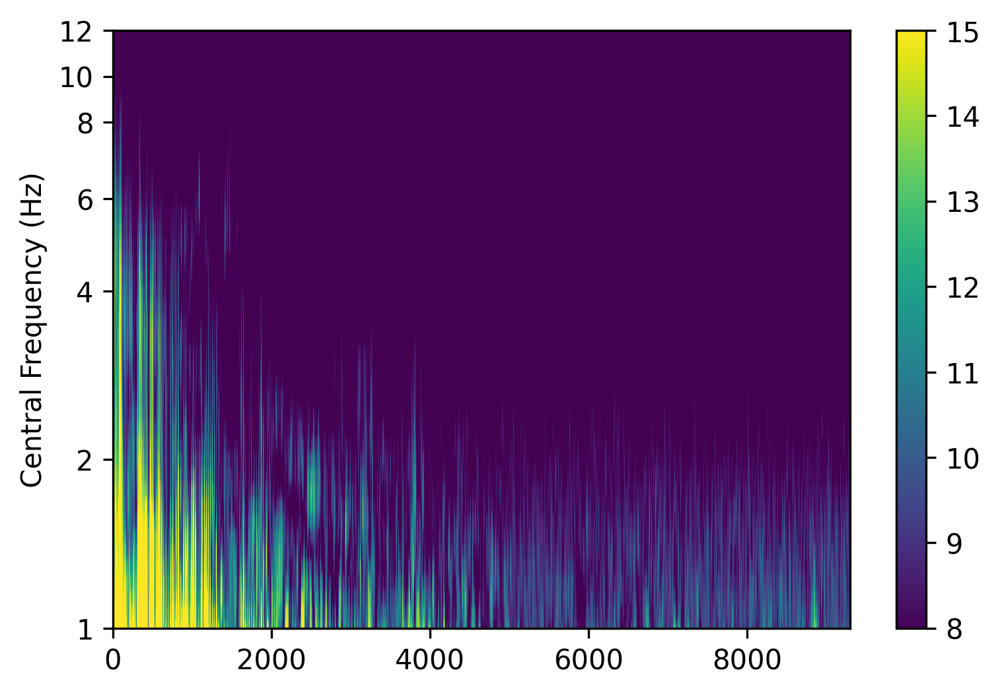

In [117]:
snrfs=np.sort(glob.glob('/scratch/zspica_root/zspica0/yaolinm/Japan/undetected/snr/*.npy'))
fqs=np.exp(np.linspace(np.log(1), np.log(12), 40))

for i in range(len(snrfs)):
    snrf=np.load(snrfs[i])
    print(snrfs[i])
    plt.figure(dpi=300)
    plt.imshow(snrf.T*2,aspect='auto',vmin=8,vmax=15)
    plt.colorbar()
    plt.yticks([0,11,22,28,33,36,39],[1,2,4,6,8,10,12])
    plt.ylabel('Central Frequency (Hz)',fontsize=10)
    plt.ylim(0,39)
    plt.show()

# detected small eq, index 1674

In [6]:
detected=np.array(h5py.File('/nfs/turbo/lsa-zspica/data/Kamaishi/Yaolin_catalog/WSS_catalog/cataloged_earthquakes/prem_model_events/index1674/index1674.h5','r')['DAS'])

In [9]:
fqs=np.exp(np.linspace(np.log(1), np.log(12), 40))
snrf=np.zeros((9300,40))
for i in range(300,9600):
    print(i)
    tr=trace(detected[i,:],100)
    cf,stf=tr.freq_snr(fqs,0.25)
    snrf[i-300,:]=stf

300
301
302
303
304
305
306
307
308
309
310
311
312
313
314
315
316
317
318
319
320
321
322
323
324
325
326
327
328
329
330
331
332
333
334
335
336
337
338
339
340
341
342
343
344
345
346
347
348
349
350
351
352
353
354
355
356
357
358
359
360
361
362
363
364
365
366
367
368
369
370
371
372
373
374
375
376
377
378
379
380
381
382
383
384
385
386
387
388
389
390
391
392
393
394
395
396
397
398
399
400
401
402
403
404
405
406
407
408
409
410
411
412
413
414
415
416
417
418
419
420
421
422
423
424
425
426
427
428
429
430
431
432
433
434
435
436
437
438
439
440
441
442
443
444
445
446
447
448
449
450
451
452
453
454
455
456
457
458
459
460
461
462
463
464
465
466
467
468
469
470
471
472
473
474
475
476
477
478
479
480
481
482
483
484
485
486
487
488
489
490
491
492
493
494
495
496
497
498
499
500
501
502
503
504
505
506
507
508
509
510
511
512
513
514
515
516
517
518
519
520
521
522
523
524
525
526
527
528
529
530
531
532
533
534
535
536
537
538
539
540
541
542
543
544
545
546
547
548
549


2084
2085
2086
2087
2088
2089
2090
2091
2092
2093
2094
2095
2096
2097
2098
2099
2100
2101
2102
2103
2104
2105
2106
2107
2108
2109
2110
2111
2112
2113
2114
2115
2116
2117
2118
2119
2120
2121
2122
2123
2124
2125
2126
2127
2128
2129
2130
2131
2132
2133
2134
2135
2136
2137
2138
2139
2140
2141
2142
2143
2144
2145
2146
2147
2148
2149
2150
2151
2152
2153
2154
2155
2156
2157
2158
2159
2160
2161
2162
2163
2164
2165
2166
2167
2168
2169
2170
2171
2172
2173
2174
2175
2176
2177
2178
2179
2180
2181
2182
2183
2184
2185
2186
2187
2188
2189
2190
2191
2192
2193
2194
2195
2196
2197
2198
2199
2200
2201
2202
2203
2204
2205
2206
2207
2208
2209
2210
2211
2212
2213
2214
2215
2216
2217
2218
2219
2220
2221
2222
2223
2224
2225
2226
2227
2228
2229
2230
2231
2232
2233
2234
2235
2236
2237
2238
2239
2240
2241
2242
2243
2244
2245
2246
2247
2248
2249
2250
2251
2252
2253
2254
2255
2256
2257
2258
2259
2260
2261
2262
2263
2264
2265
2266
2267
2268
2269
2270
2271
2272
2273
2274
2275
2276
2277
2278
2279
2280
2281
2282
2283


3726
3727
3728
3729
3730
3731
3732
3733
3734
3735
3736
3737
3738
3739
3740
3741
3742
3743
3744
3745
3746
3747
3748
3749
3750
3751
3752
3753
3754
3755
3756
3757
3758
3759
3760
3761
3762
3763
3764
3765
3766
3767
3768
3769
3770
3771
3772
3773
3774
3775
3776
3777
3778
3779
3780
3781
3782
3783
3784
3785
3786
3787
3788
3789
3790
3791
3792
3793
3794
3795
3796
3797
3798
3799
3800
3801
3802
3803
3804
3805
3806
3807
3808
3809
3810
3811
3812
3813
3814
3815
3816
3817
3818
3819
3820
3821
3822
3823
3824
3825
3826
3827
3828
3829
3830
3831
3832
3833
3834
3835
3836
3837
3838
3839
3840
3841
3842
3843
3844
3845
3846
3847
3848
3849
3850
3851
3852
3853
3854
3855
3856
3857
3858
3859
3860
3861
3862
3863
3864
3865
3866
3867
3868
3869
3870
3871
3872
3873
3874
3875
3876
3877
3878
3879
3880
3881
3882
3883
3884
3885
3886
3887
3888
3889
3890
3891
3892
3893
3894
3895
3896
3897
3898
3899
3900
3901
3902
3903
3904
3905
3906
3907
3908
3909
3910
3911
3912
3913
3914
3915
3916
3917
3918
3919
3920
3921
3922
3923
3924
3925


5369
5370
5371
5372
5373
5374
5375
5376
5377
5378
5379
5380
5381
5382
5383
5384
5385
5386
5387
5388
5389
5390
5391
5392
5393
5394
5395
5396
5397
5398
5399
5400
5401
5402
5403
5404
5405
5406
5407
5408
5409
5410
5411
5412
5413
5414
5415
5416
5417
5418
5419
5420
5421
5422
5423
5424
5425
5426
5427
5428
5429
5430
5431
5432
5433
5434
5435
5436
5437
5438
5439
5440
5441
5442
5443
5444
5445
5446
5447
5448
5449
5450
5451
5452
5453
5454
5455
5456
5457
5458
5459
5460
5461
5462
5463
5464
5465
5466
5467
5468
5469
5470
5471
5472
5473
5474
5475
5476
5477
5478
5479
5480
5481
5482
5483
5484
5485
5486
5487
5488
5489
5490
5491
5492
5493
5494
5495
5496
5497
5498
5499
5500
5501
5502
5503
5504
5505
5506
5507
5508
5509
5510
5511
5512
5513
5514
5515
5516
5517
5518
5519
5520
5521
5522
5523
5524
5525
5526
5527
5528
5529
5530
5531
5532
5533
5534
5535
5536
5537
5538
5539
5540
5541
5542
5543
5544
5545
5546
5547
5548
5549
5550
5551
5552
5553
5554
5555
5556
5557
5558
5559
5560
5561
5562
5563
5564
5565
5566
5567
5568


7012
7013
7014
7015
7016
7017
7018
7019
7020
7021
7022
7023
7024
7025
7026
7027
7028
7029
7030
7031
7032
7033
7034
7035
7036
7037
7038
7039
7040
7041
7042
7043
7044
7045
7046
7047
7048
7049
7050
7051
7052
7053
7054
7055
7056
7057
7058
7059
7060
7061
7062
7063
7064
7065
7066
7067
7068
7069
7070
7071
7072
7073
7074
7075
7076
7077
7078
7079
7080
7081
7082
7083
7084
7085
7086
7087
7088
7089
7090
7091
7092
7093
7094
7095
7096
7097
7098
7099
7100
7101
7102
7103
7104
7105
7106
7107
7108
7109
7110
7111
7112
7113
7114
7115
7116
7117
7118
7119
7120
7121
7122
7123
7124
7125
7126
7127
7128
7129
7130
7131
7132
7133
7134
7135
7136
7137
7138
7139
7140
7141
7142
7143
7144
7145
7146
7147
7148
7149
7150
7151
7152
7153
7154
7155
7156
7157
7158
7159
7160
7161
7162
7163
7164
7165
7166
7167
7168
7169
7170
7171
7172
7173
7174
7175
7176
7177
7178
7179
7180
7181
7182
7183
7184
7185
7186
7187
7188
7189
7190
7191
7192
7193
7194
7195
7196
7197
7198
7199
7200
7201
7202
7203
7204
7205
7206
7207
7208
7209
7210
7211


8654
8655
8656
8657
8658
8659
8660
8661
8662
8663
8664
8665
8666
8667
8668
8669
8670
8671
8672
8673
8674
8675
8676
8677
8678
8679
8680
8681
8682
8683
8684
8685
8686
8687
8688
8689
8690
8691
8692
8693
8694
8695
8696
8697
8698
8699
8700
8701
8702
8703
8704
8705
8706
8707
8708
8709
8710
8711
8712
8713
8714
8715
8716
8717
8718
8719
8720
8721
8722
8723
8724
8725
8726
8727
8728
8729
8730
8731
8732
8733
8734
8735
8736
8737
8738
8739
8740
8741
8742
8743
8744
8745
8746
8747
8748
8749
8750
8751
8752
8753
8754
8755
8756
8757
8758
8759
8760
8761
8762
8763
8764
8765
8766
8767
8768
8769
8770
8771
8772
8773
8774
8775
8776
8777
8778
8779
8780
8781
8782
8783
8784
8785
8786
8787
8788
8789
8790
8791
8792
8793
8794
8795
8796
8797
8798
8799
8800
8801
8802
8803
8804
8805
8806
8807
8808
8809
8810
8811
8812
8813
8814
8815
8816
8817
8818
8819
8820
8821
8822
8823
8824
8825
8826
8827
8828
8829
8830
8831
8832
8833
8834
8835
8836
8837
8838
8839
8840
8841
8842
8843
8844
8845
8846
8847
8848
8849
8850
8851
8852
8853


(0.0, 39.0)

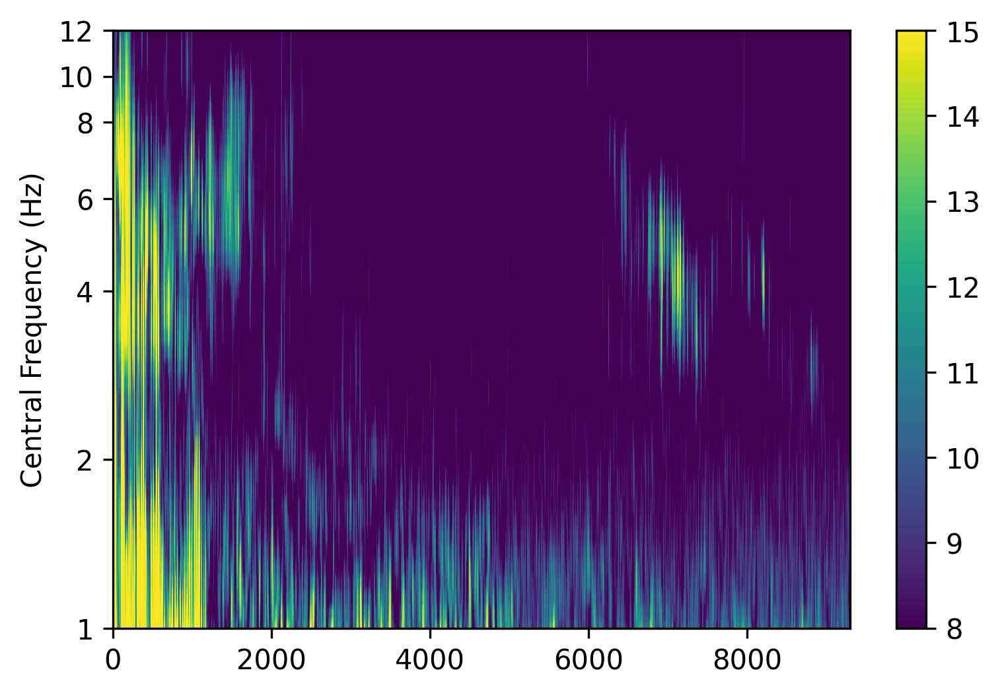

In [10]:
plt.figure(dpi=300)
plt.imshow(snrf.T*2,aspect='auto',vmin=8,vmax=15)
plt.colorbar()
# plt.xticks([])
plt.yticks([0,11,22,28,33,36,39],[1,2,4,6,8,10,12])
plt.ylabel('Central Frequency (Hz)',fontsize=10)
plt.ylim(0,39)

In [7]:
## data
obs1=obspy.read('/scratch/zspica_root/zspica0/yaolinm/Japan/figure_12/obs1.mseed')
obs2=obspy.read('/scratch/zspica_root/zspica0/yaolinm/Japan/figure_12/obs2.mseed')
obs3=obspy.read('/scratch/zspica_root/zspica0/yaolinm/Japan/figure_12/obs3.mseed')

obs11=obs1[0].copy()
obs11.filter('bandpass',freqmin=3,freqmax=7)
obs21=obs2[0].copy()
obs21.filter('bandpass',freqmin=3,freqmax=7)
obs31=obs3[0].copy()
obs31.filter('bandpass',freqmin=3,freqmax=7)

snrf=np.load('/scratch/zspica_root/zspica0/yaolinm/Japan/figure_12/snrf.npy')
snrf2=np.load('/scratch/zspica_root/zspica0/yaolinm/Japan/figure_12/snrf2.npy')
snrf3=np.load('/scratch/zspica_root/zspica0/yaolinm/Japan/figure_12/snrf3.npy')

df1=np.array(h5py.File('/scratch/zspica_root/zspica0/yaolinm/Japan/figure_12/index1674.h5','r')['DAS'])
df2=np.load('/scratch/zspica_root/zspica0/yaolinm/Japan/figure_12/data.npy')
df3=np.array(h5py.File('/scratch/zspica_root/zspica0/yaolinm/Japan/figure_12/onefile_index1677.h5','r')['DAS'])

/tmp/ipykernel_2071697/1936352323.py:17: DeprecationWarning: `product` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `prod` instead.
  df1=np.array(h5py.File('/scratch/zspica_root/zspica0/yaolinm/Japan/figure_12/index1674.h5','r')['DAS'])
/tmp/ipykernel_2071697/1936352323.py:19: DeprecationWarning: `product` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `prod` instead.
  df3=np.array(h5py.File('/scratch/zspica_root/zspica0/yaolinm/Japan/figure_12/onefile_index1677.h5','r')['DAS'])


In [9]:
obs3

1 Trace(s) in Stream:
.E.SOB..XH | 2019-11-24T02:07:37.970000Z - 2019-11-24T02:08:07.970000Z | 100.0 Hz, 3001 samples

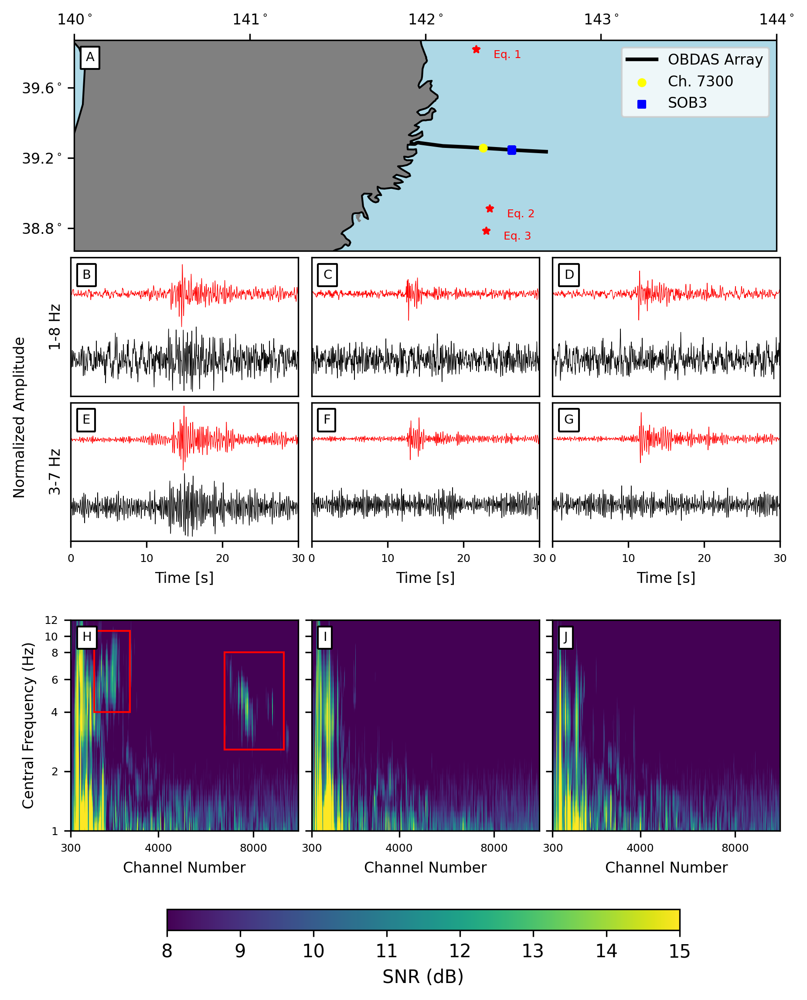

In [18]:
fig=plt.figure(figsize=(7,8),dpi=300)
fig.subplots_adjust(hspace=0.1,wspace=0.2)
proj = ccrs.PlateCarree()

width=0.3

ax1 = plt.subplot2grid(shape=(11,9), loc=(0,0), colspan=9,rowspan=3, projection=proj)

ax2 = plt.subplot2grid(shape=(11,9), loc=(3,0), colspan=3,rowspan=2)
ax3 = plt.subplot2grid(shape=(11,9), loc=(3,3), colspan=3,rowspan=2)
ax4 = plt.subplot2grid(shape=(11,9), loc=(3,6), colspan=3,rowspan=2)

ax5 = plt.subplot2grid(shape=(11,9), loc=(5,0), colspan=3,rowspan=2)
ax6 = plt.subplot2grid(shape=(11,9), loc=(5,3), colspan=3,rowspan=2)
ax7 = plt.subplot2grid(shape=(11,9), loc=(5,6), colspan=3,rowspan=2)

ax8 = plt.subplot2grid(shape=(11,9), loc=(8,0), colspan=3,rowspan=3)
ax9 = plt.subplot2grid(shape=(11,9), loc=(8,3), colspan=3,rowspan=3)
ax10 = plt.subplot2grid(shape=(11,9), loc=(8,6), colspan=3,rowspan=3)

axs=[ax1,ax2,ax3,ax4,ax5,ax6,ax7,ax8,ax9,ax10]

for ax in axs:
    ax.set_xticks([])
    ax.set_yticks([])

ax2.plot(normalize(obs1[0].data[:3000],obs1[0].data[:3000])+1,lw=width,c='r')
ax2.plot(normalize(obspy_filter(df1[7300,800:3800],1,8,100),obspy_filter(df1[7300,800:3800],1,8,100))-1,lw=width,c='k')
ax2.set_xlim(0,3000)
ax2.set_ylim(-2.1,2.1)

ax3.plot(normalize(obs2[0].data[:3000],obs1[0].data[:3000])+1,lw=width,c='r')
ax3.plot(normalize(obspy_filter(df2[7300,800:3800],1,8,100),obspy_filter(df1[7300,800:3800],1,8,100))-1,lw=width,c='k')
ax3.set_xlim(0,3000)
ax3.set_ylim(-2.1,2.1)

ax4.plot(normalize(obs3[0].data[:3000],obs1[0].data[:3000])+1,lw=width,c='r')
ax4.plot(normalize(obspy_filter(df3[7300,800:3800],1,8,100),obspy_filter(df1[7300,800:3800],1,8,100))-1,lw=width,c='k')
ax4.set_xlim(0,3000)
ax4.set_ylim(-2.1,2.1)

ax5.plot(normalize(obs11.data[:3000],obs11.data[:3000])+1,lw=width,c='r')
ax5.plot(normalize(obspy_filter(df1[7300,800:3800],3,7,100),obspy_filter(df1[7300,800:3800],3,7,100))-1,lw=width,c='k')
ax5.set_xlim(0,3000)
ax5.set_ylim(-2,2.1)

ax6.plot(normalize(obs21.data[:3000],obs11.data[:3000])+1,lw=width,c='r')
ax6.plot(normalize(obspy_filter(df2[7300,800:3800],3,7,100),obspy_filter(df1[7300,800:3800],3,7,100))-1,lw=width,c='k')
ax6.set_xlim(0,3000)
ax6.set_ylim(-2.1,2.1)

ax7.plot(normalize(obs31.data[:3000],obs11.data[:3000])+1,lw=width,c='r')
ax7.plot(normalize(obspy_filter(df3[7300,800:3800],3,7,100),obspy_filter(df1[7300,800:3800],3,7,100))-1,lw=width,c='k')
ax7.set_xlim(0,3000)
ax7.set_ylim(-2.1,2.1)

for ax in [ax5,ax6,ax7]:
    ax.set_xticks([0,1000,2000,3000])
    ax.set_xticklabels([0,10,20,30],fontsize=6)
    ax.set_xlabel('Time [s]',fontsize=8)
    
ax2.set_ylabel('1-8 Hz',fontsize=8)
ax5.set_ylabel('3-7 Hz',fontsize=8)

ax8.imshow(snrf.T*2,aspect='auto',vmin=8,vmax=15)
ax8.set_yticks([0,11,22,28,33,36,39])
ax8.set_yticklabels([1,2,4,6,8,10,12],fontsize=6)
ax8.set_ylabel('Central Frequency (Hz)',fontsize=8)
ax8.set_ylim(0,39)

ax9.imshow(snrf2.T*2,aspect='auto',vmin=8,vmax=15)
ax9.set_yticks([0,11,22,28,33,36,39])
ax9.set_yticklabels(['','','','','','',''],fontsize=6)
ax9.set_ylim(0,39)

ishow=ax10.imshow(snrf3.T*2,aspect='auto',vmin=8,vmax=15)
ax10.set_yticks([0,11,22,28,33,36,39])
ax10.set_yticklabels(['','','','','','',''],fontsize=6)
ax10.set_ylim(0,39)

for ax in [ax8,ax9,ax10]:
    ax.set_xlim(300,9600)
    ax.set_xticks([0,3700,7700])
    ax.set_xticklabels([300,4000,8000],fontsize=6)
    ax.set_xlabel('Channel Number',fontsize=8)

ax1.set_xlim(140,144)
ax1.set_ylim(38.67,39.87)
ax1.plot(lons[:13722],lats[:13722],c='k',lw=2,label='OBDAS Array')
ax1.add_feature(cfeature.COASTLINE,edgecolor='black')
ax1.add_feature(cfeature.LAND,facecolor='grey')
ax1.add_feature(cfeature.OCEAN,facecolor='lightblue')
ax1.set_xticks([140,141,142,143,144])
ax1.set_xticklabels(['$140^\circ$','$141^\circ$','$142^\circ$','$143^\circ$','$144^\circ$'],fontsize=8,fontweight='bold')
ax1.xaxis.tick_top()
ax1.set_yticks([38.8,39.2,39.6])
ax1.set_yticklabels(['$38.8^\circ$','$39.2^\circ$','$39.6^\circ$'],fontsize=8,fontweight='bold')
ax1.scatter(eq1_lon,eq1_lat,marker='*',s=15,c='r',zorder=10)
ax1.text(eq1_lon+0.1,eq1_lat-0.05,'Eq. 1',fontsize=6,c='r')
ax1.scatter(eq2_lon,eq2_lat,marker='*',s=15,c='r',zorder=10)
ax1.text(eq2_lon+0.1,eq2_lat-0.05,'Eq. 2',fontsize=6,c='r')
ax1.scatter(eq3_lon,eq3_lat,marker='*',s=15,c='r',zorder=10)
ax1.text(eq3_lon+0.1,eq3_lat-0.05,'Eq. 3',fontsize=6,c='r')
ax1.scatter(lons[7300],lats[7300],marker='o',s=15,c='yellow',zorder=10,label='Ch. 7300')
ax1.scatter(lons[10265],lats[10265],marker='s',s=15,c='b',zorder=10,label='SOB3')
ax1.legend(fontsize=8)


letters=['A','B','C','D','E','F','G','H','I','J']
for i in range(len(letters)):
    at = AnchoredText(letters[i],prop=dict(size=7), frameon=True,loc=2,)
    at.patch.set_boxstyle('round',pad=0,rounding_size=0.05)
    axs[i].add_artist(at)
    
fig.text(0.07,0.52,'Normalized Amplitude',fontsize=8,ha='center',va='center',rotation=90)

cax = fig.add_axes([0.23, 0.03, 0.56, 0.02])
fig.colorbar(ishow,cax=cax,orientation='horizontal', label='SNR (dB)')

rect = patches.Rectangle((6500,15), 2500, 18, linewidth=1, edgecolor='r',linestyle='-',facecolor='none',clip_on=False)
ax8.add_patch(rect)
rect = patches.Rectangle((1000,22), 1500, 15, linewidth=1, edgecolor='r',linestyle='-',facecolor='none',clip_on=False)
ax8.add_patch(rect)